In [1]:
import os
import csv
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile
from IPython.display import Audio, display

In [2]:
full_dir = "data/processed/full_by_label"
copd_dir = os.path.join(full_dir, "copd")
healthy_dir = os.path.join(full_dir, "healthy")

In [3]:
#Summary
def count_patients_and_cycles(folder):
    patients = set()
    total_cycles = 0
    for fname in os.listdir(folder):
        if fname.endswith(".txt"):
            patients.add(fname.split("_")[0])
            txt_path = os.path.join(folder, fname)
            with open(txt_path, "r") as f:
                total_cycles += sum(1 for line in f if line.strip())
    return len(patients), total_cycles

copd_patients, copd_cycles = count_patients_and_cycles(copd_dir)
healthy_patients, healthy_cycles = count_patients_and_cycles(healthy_dir)

print(f"COPD patients: {copd_patients}, total cycles: {copd_cycles}")
print(f"Healthy patients: {healthy_patients}, total cycles: {healthy_cycles}")

COPD patients: 18, total cycles: 1539
Healthy patients: 7, total cycles: 71


In [4]:
def plot_waveform_with_cycles(wav_path, txt_path):
    #Load audio
    sr, audio = wavfile.read(wav_path)
    if audio.ndim > 1:  #convert stereo to mono
        audio = audio.mean(axis=1)
    t = np.arange(len(audio)) / sr

    plt.figure(figsize=(15,3))
    plt.plot(t, audio, color='steelblue')

    #Load cycles
    with open(txt_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 2:
                continue
            start_sec = float(parts[0])
            stop_sec = float(parts[1])
            plt.axvline(start_sec, color='red', linestyle='--', alpha=0.6)
            plt.axvline(stop_sec, color='red', linestyle='--', alpha=0.6)

    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.title(os.path.basename(wav_path))
    plt.grid(True)
    plt.show()


In [6]:
def inspect_first_n(folder, n=3):
    txt_files = sorted([f for f in os.listdir(folder) if f.endswith(".txt")])
    seen_patients = set()
    count = 0

    for txt_fname in txt_files:
        patient_id = txt_fname.split("_")[0]
        if patient_id in seen_patients:
            continue
        seen_patients.add(patient_id)
        count += 1
        txt_path = os.path.join(folder, txt_fname)
        wav_fname = txt_fname.replace(".txt", ".wav")
        wav_path = os.path.join(folder, wav_fname)

        #Print txt contents
        print(f"{patient_id} annotation ({txt_fname}):")
        with open(txt_path, "r") as f:
            print(f.read())

        #Plot waveform with cycles
        plot_waveform_with_cycles(wav_path, txt_path)

        #Play audio inline
        display(Audio(filename=wav_path))

        if count >= n:
            break

COPD PATIENTS
104 annotation (104_1b1_Al_sc_Litt3200.txt):
0	1.8771	0	0
1.8771	3.7543	0	0
3.7543	6.1071	0	0
6.1071	8.2502	0	0
8.2502	12.618	0	0
12.618	15.856	0	0



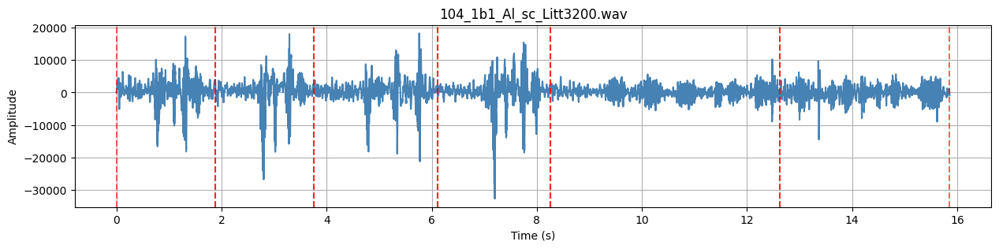

106 annotation (106_2b1_Pl_mc_LittC2SE.txt):
0.036	2.164	1	0
2.164	4.621	1	0
4.621	7.179	0	0
7.179	9.636	1	0
9.636	12.007	1	0
12.007	14.407	1	0
14.407	16.793	1	0
16.793	19.207	1	0
19.207	19.964	1	0



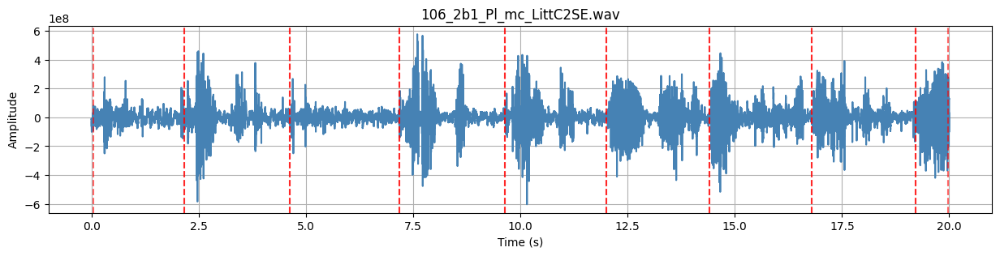

107 annotation (107_2b3_Al_mc_AKGC417L.txt):
0.887	2.601	1	0
2.601	5.327	1	0
5.327	7.923	1	0
7.923	10.53	1	0
10.53	13.196	1	0
13.196	15.565	1	0
15.565	18.054	1	0
18.054	19.101	0	0



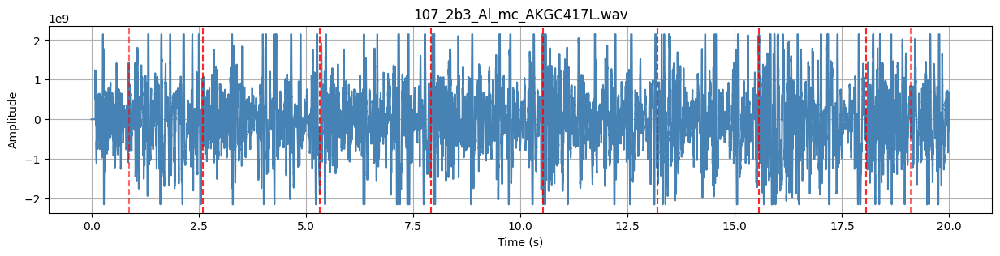

HEALTHY PATIENTS
102 annotation (102_1b1_Ar_sc_Meditron.txt):
0.264	1.736	0	0
1.736	3.293	0	0
3.293	5.307	0	0
5.307	6.636	0	0
6.636	8.036	0	0
8.036	9.607	0	0
9.607	11.036	0	0
11.036	13.036	0	0
13.036	14.664	0	0
14.664	16.393	0	0
16.393	17.893	0	0
17.893	19.593	0	0
19.593	19.964	0	0



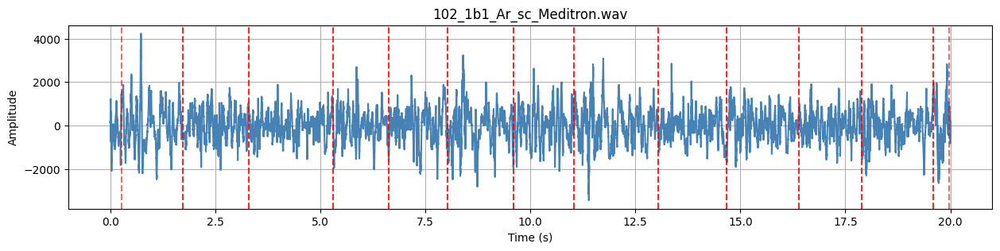

121 annotation (121_1b1_Tc_sc_Meditron.txt):
0.007	2.064	0	0
2.064	5.921	0	0
5.921	10.107	0	0
10.107	14.493	0	0
14.493	18.893	0	0
18.893	19.979	0	0



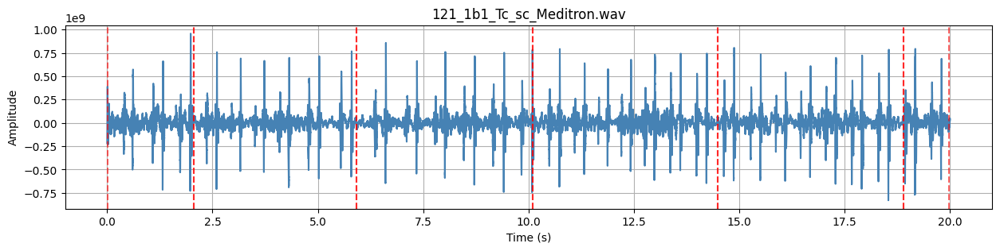

123 annotation (123_1b1_Al_sc_Meditron.txt):
0.45	2.979	0	0
2.979	5.593	0	0
5.593	8.207	0	0
8.207	10.779	0	0
10.779	14.279	0	0
14.279	16.779	0	0
16.779	19.45	0	0
19.45	19.979	0	0



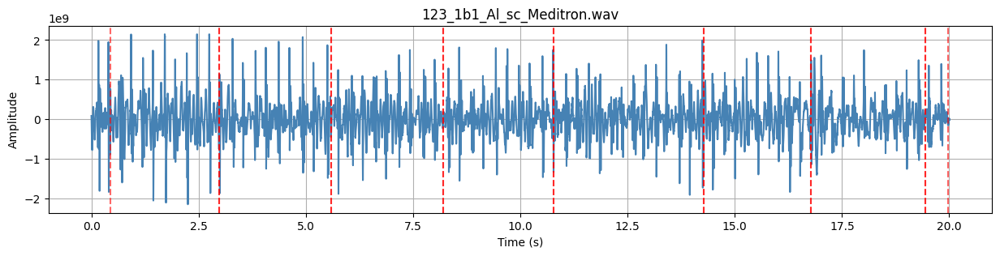

In [7]:
#Inspect 3 COPD patients
print("COPD PATIENTS")
inspect_first_n(copd_dir, n=3)

#3 Healthy patients
print("HEALTHY PATIENTS")
inspect_first_n(healthy_dir, n=3)